# Imports & Data Loading

In [ ]:
import networkx as nx
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
from collections import Counter
from itertools import cycle
import matplotlib.cm as cm

In [ ]:
# Path to the edge list file
file_path = 'sample_data/soc-hamsterster.edges'

# Initialize an empty graph
G = nx.Graph()

# Load the graph from the edge list file
with open(file_path, 'r') as file:
    for line in file:
        if not line.startswith('%'):  # Ignore comment lines
            node1, node2 = map(int, line.split())  # Split the line into two nodes
            G.add_edge(node1, node2)  # Add an edge between the two nodes

#Sort the nodes and ensure every node label is an integer
H = nx.Graph()
H.add_nodes_from(sorted(G.nodes, key=int))
H.add_edges_from(G.edges(data=True))
H.nodes
G = nx.convert_node_labels_to_integers(H)

# Optional: Check basic information about the graph
print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")

Number of nodes: 2426
Number of edges: 16630


# Data Exploration & Visualizations

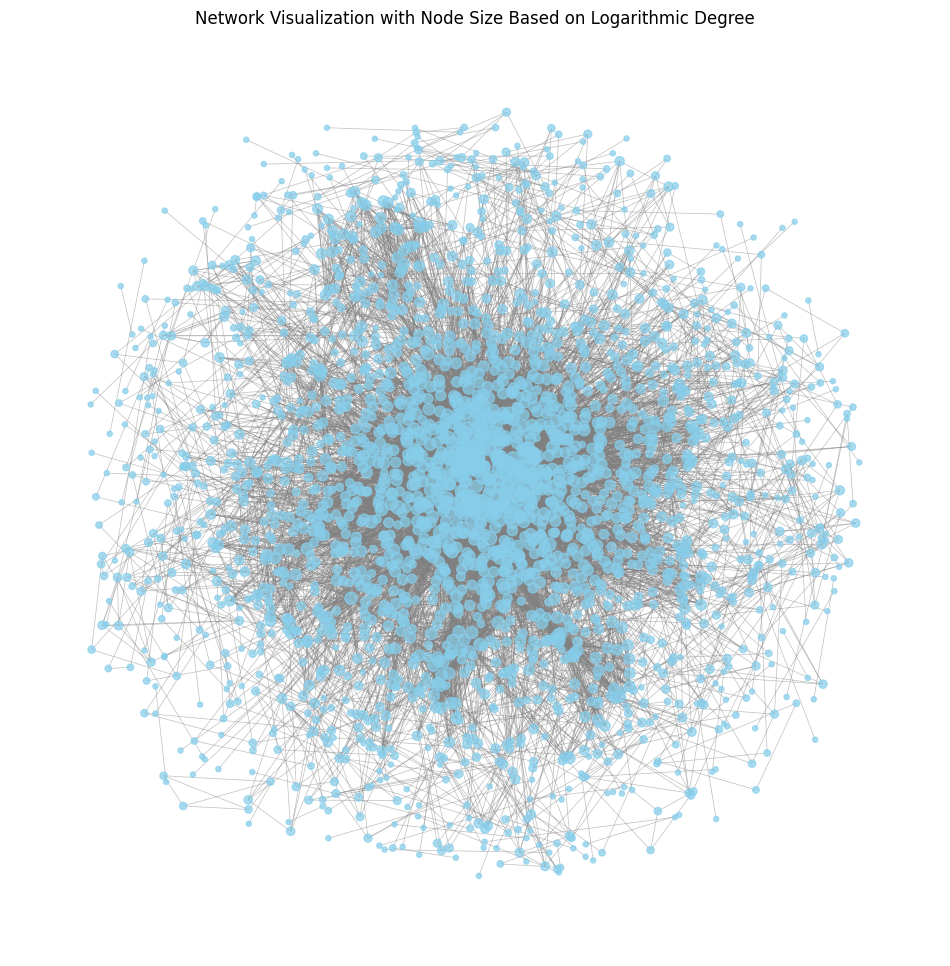

In [ ]:
# Get degrees of nodes
degrees = dict(G.degree())

# Logarithmic scaling for node sizes (decreased scale factor)
node_sizes = [np.log(v + 1) * 20 for v in degrees.values()]  # Scale down sizes

# Generate the spring layout with adjusted parameters
pos = nx.spring_layout(G, k=0.1, iterations=20)  # Adjust k for spacing

# Draw the graph
plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='skyblue', alpha=0.7)
nx.draw_networkx_edges(G, pos, width=0.5, alpha=0.5, edge_color='gray')  # Increased edge visibility
plt.title('Network Visualization with Node Size Based on Logarithmic Degree')
plt.axis('off')  # Turn off the axis
plt.show()

<ipython-input-5-ede795c682eb>:30: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(ScalarMappable(norm=norm, cmap=cmap), label='Node Degree')  # Add a color bar


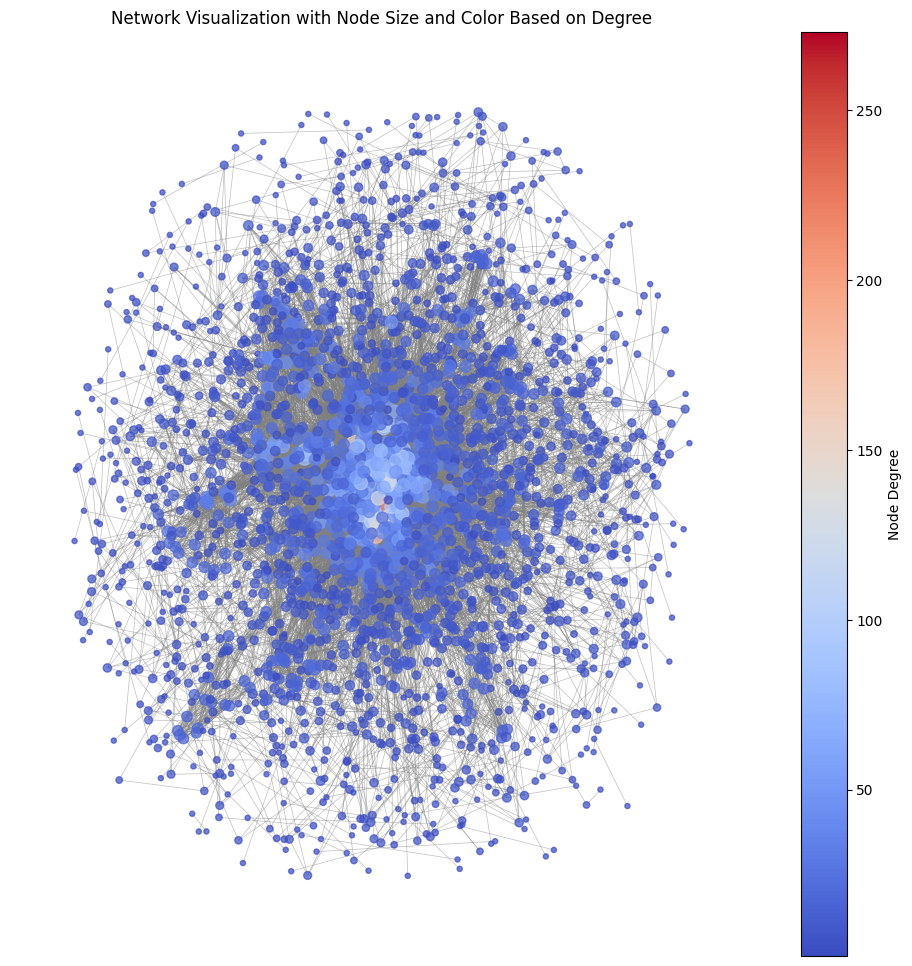

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# Get degrees of nodes
degrees = dict(G.degree())
degree_values = list(degrees.values())

# Logarithmic scaling for node sizes (adjust scaling if needed)
node_sizes = [np.log(v + 1) * 20 for v in degree_values]  # Scale down sizes

# Normalize degrees for color mapping
norm = Normalize(vmin=min(degree_values), vmax=max(degree_values))
cmap = plt.get_cmap('coolwarm')  # You can choose 'coolwarm' or 'RdYlGn', etc.

# Assign colors based on normalized degrees
node_colors = [cmap(norm(degree)) for degree in degree_values]

# Generate the spring layout with adjusted parameters
pos = nx.spring_layout(G, k=0.1, iterations=20)  # Adjust k for spacing

# Draw the graph
plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=node_colors, alpha=0.7)
nx.draw_networkx_edges(G, pos, width=0.5, alpha=0.5, edge_color='gray')  # Increased edge visibility
plt.title('Network Visualization with Node Size and Color Based on Degree')
plt.axis('off')  # Turn off the axis
plt.colorbar(ScalarMappable(norm=norm, cmap=cmap), label='Node Degree')  # Add a color bar
plt.show()

<ipython-input-6-3f584832d84e>:25: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(ScalarMappable(norm=norm, cmap=cmap), label='Log of Node Degree')  # Add a color bar


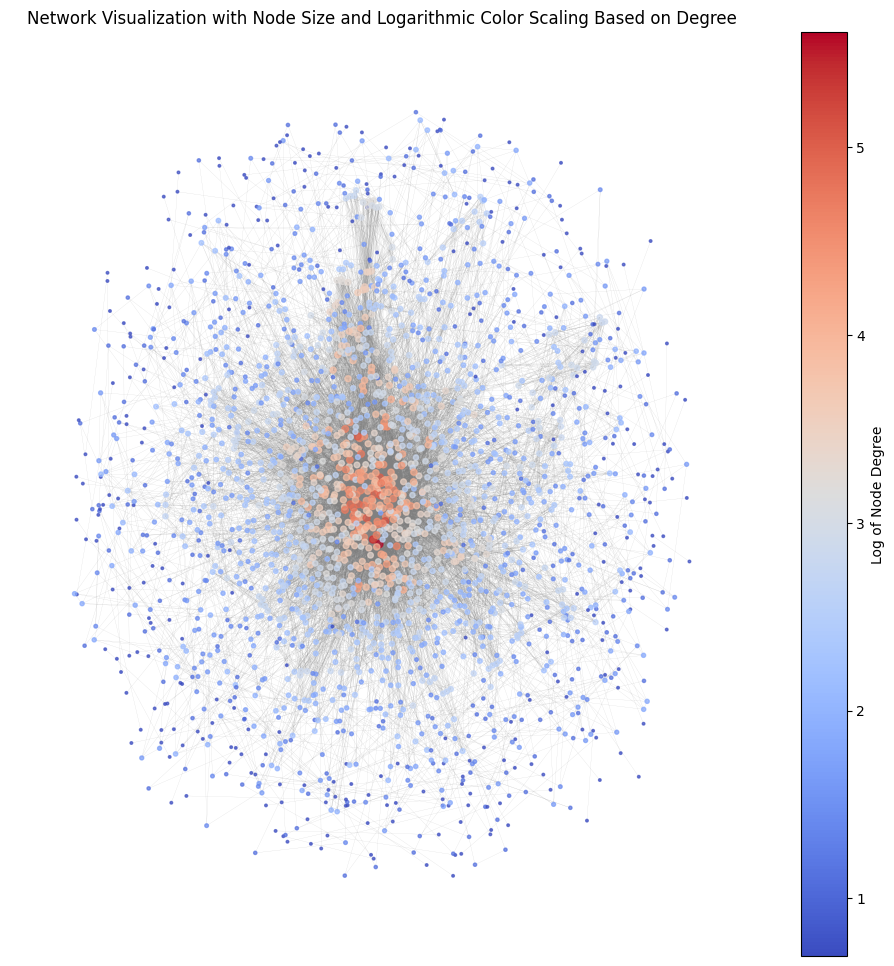

In [ ]:
# Get degrees of nodes
degrees = dict(G.degree())
degree_values = list(degrees.values())

# Logarithmic scaling for node sizes
node_sizes = [np.log(v + 1) * 5 for v in degree_values]  # Scale down sizes

# Logarithmic normalization for color mapping
log_degrees = np.log(np.array(degree_values) + 1)  # Logarithmic scaling with a small offset
norm = Normalize(vmin=log_degrees.min(), vmax=log_degrees.max())
cmap = plt.get_cmap('coolwarm')  # Transition from aqua to red

# Assign colors based on normalized logarithmic degrees
node_colors = [cmap(norm(log_degree)) for log_degree in log_degrees]

# Generate the spring layout with adjusted parameters
pos = nx.spring_layout(G, k=0.1, iterations=20)  # Adjust k for spacing

# Draw the graph
plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=node_colors, alpha=0.7)
nx.draw_networkx_edges(G, pos, width=0.1, alpha=0.5, edge_color='gray')  # Increased edge visibility
plt.title('Network Visualization with Node Size and Logarithmic Color Scaling Based on Degree')
plt.axis('off')  # Turn off the axis
plt.colorbar(ScalarMappable(norm=norm, cmap=cmap), label='Log of Node Degree')  # Add a color bar
plt.show()

,Node Count
Degree,
1,304
2,230
3,181
4,196
5,140
...,...
151,1
154,1
173,1


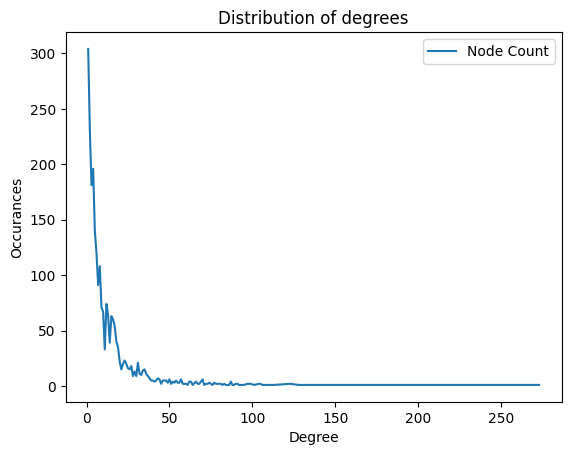

In [ ]:
# Get the degree of each node in the graph
degree_sequence = [degree for node, degree in G.degree()]

# Create a pandas DataFrame with the degree values
degree_df = pd.DataFrame(degree_sequence, columns=['Degree'])

# Count how many nodes have each degree value
degree_count_df = degree_df['Degree'].value_counts().reset_index()

# Rename the columns
degree_count_df.columns = ['Degree', 'Node Count']

# Sort by degree (optional)
degree_count_df = degree_count_df.sort_values(by='Degree')

#Set the degree to be the index
degree_count_df = degree_count_df.set_index('Degree')

# Show the result
#pd.set_option('display.max_rows', None)
display(degree_count_df)
#pd.reset_option('all')

#Plot the degree distribution
df = degree_count_df.plot()
df.set_title('Distribution of degrees')
df.set_ylabel('Occurances');

In [ ]:
pd.set_option('display.max_rows', None)
display(degree_count_df)
pd.reset_option('all')

,Node Count
Degree,
1,304
2,230
3,181
4,196
5,140
6,120
7,91
8,108
9,71


<ipython-input-8-951667a8e7a0>:3: FutureWarning: data_manager option is deprecated and will be removed in a future version. Only the BlockManager will be available.
  pd.reset_option('all')
<ipython-input-8-951667a8e7a0>:3: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  pd.reset_option('all')


# Modularity Score

In [ ]:
def modularity(G, partition):
    """
    Calculates the modularity score for a given partition on a graph G

    Parameters:
    G : networkx.Graph, The input graph.
    partition : dict, A dictionary where keys are nodes and values are community labels.
        """

    # Total number of edges in the graph
    m = G.size(weight='weight')

    # Degree of each node
    degree = dict(G.degree(weight='weight'))

    # Initialize modularity
    Q = 0.0

    # Iterate over all pairs of nodes
    for i in G.nodes():
        for j in G.nodes():
            if partition[i] == partition[j]:  # Nodes i and j are in the same community
                A_ij = 1 if G.has_edge(i, j) else 0  # Adjacency matrix A_ij
                expected_ij = (degree[i] * degree[j]) / (2 * m)  # Expected number of edges in configuration model
                Q += A_ij - expected_ij

    # Modularity is normalized by 1 / (2m)
    Q /= (2 * m)

    return Q

# Louvain algoritm

We first run the Louvain algoritm without trying to tune the resolution

In [ ]:
# Function that runs Louvain community detection and plots the resulting graph
# with communities labeled by different colors

def FindandShowCommunities(G,pos=None,resolution=1,seed=123, plot=True):

    # Run Louvain to get the communities
    C = nx.community.louvain_communities(G,resolution=resolution,seed=seed)

    if plot:
        number_communities = len(C)

        # Next we create color for the different communities
        # We cycle through all rgb values [0,1] in an equal number of steps
        # and use a modulo 2 operation to jump between either adding red or
        # green to create contrast between community colors
        colors = []
        node_colors = {}
        for c in range(0,number_communities):
            r = 1-(c % 2)*(c/number_communities)
            g = 1-((c+1) % 2)*(c/number_communities)
            b = (c%2)*(c/number_communities)
            colors.append((r,g,b))
            community_members = C[c]
            for node in community_members:
                node_colors[node]=(r,g,b)

        n = G.number_of_nodes()

        # Assing group colors to the nodes
        group_colors = []

        for i in range(0,n):
            node_color = node_colors[i]
            group_colors.append(node_color)

        # Draw the graph.
        fig = plt.figure(figsize=(50,50))
        nx.draw_networkx(G,pos=pos,node_color=group_colors,node_size=1000)

    return C

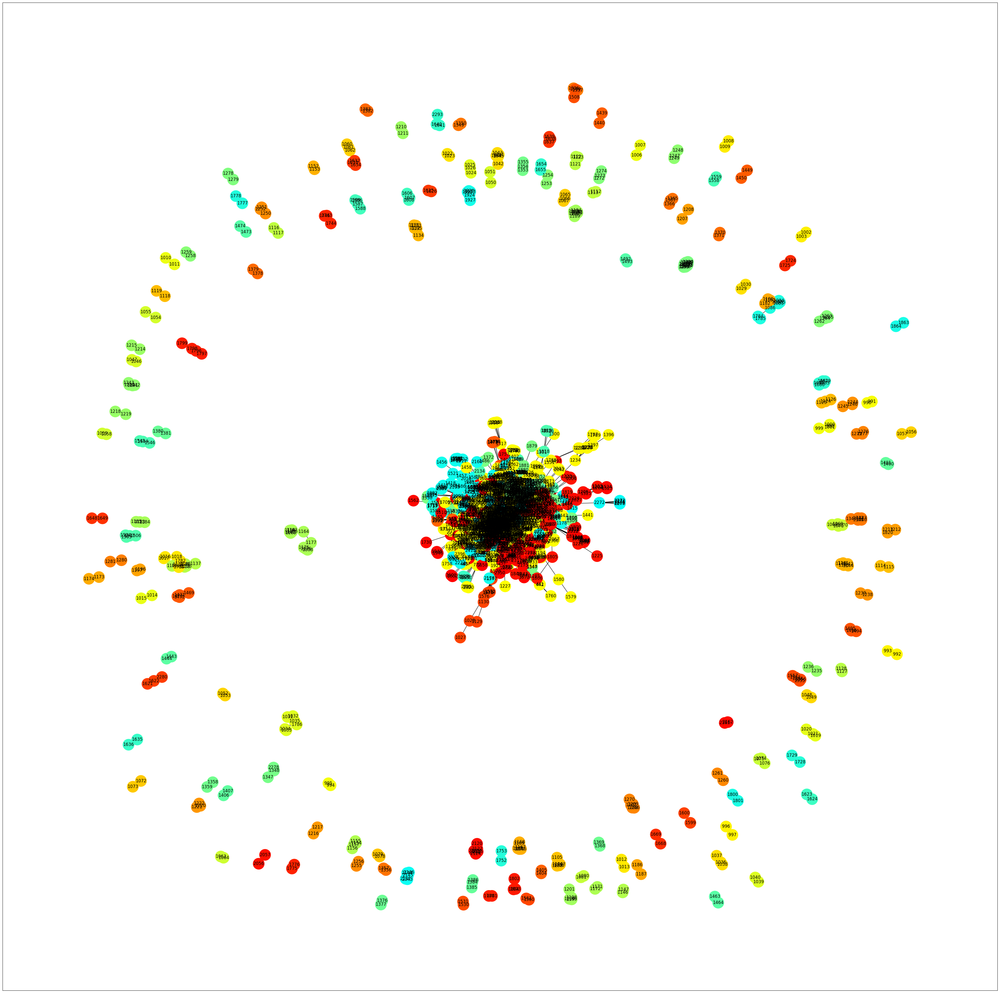

In [ ]:
initial_louvain_communities = FindandShowCommunities(G)

In [ ]:
len(initial_louvain_communities)

171

To get an initial idea to the best resolution, eye-ball the number of communities in the data and pick resolution that results in a comparible number of communities

Idea: For many different resolutions, calculate modularity, Conductance and Silhouette score and plot these scores over resolution values. Make trade-off to find best one

# Conductance & Silhouette Score

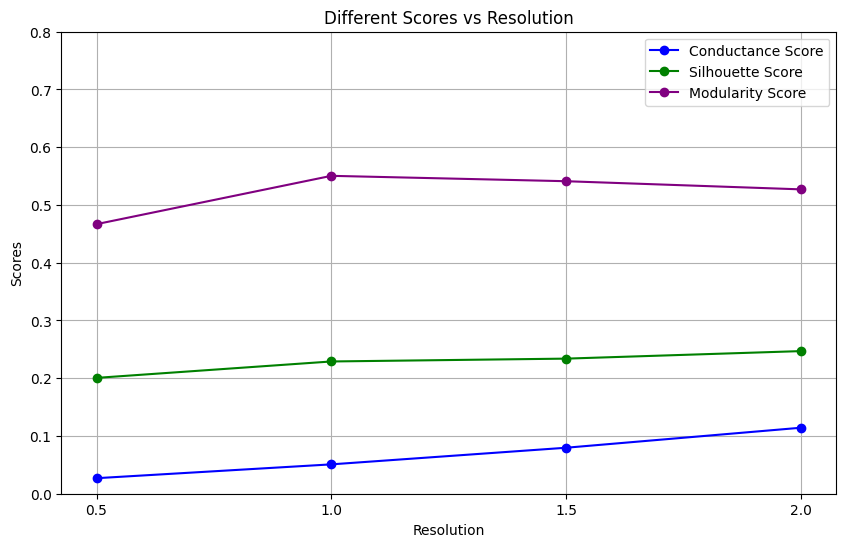

In [ ]:
from sklearn.metrics import silhouette_score

def FindCommunities(G,pos=None,resolution=1,seed=123):
    C = nx.community.louvain_communities(G,resolution=resolution,seed=seed)
    return C

def run_louvain_community_detection(G, resolution=1, seed=123):
    # Run Louvain community detection with specified resolution
    communities = FindCommunities(G, resolution=resolution, seed=seed)
    return communities

def calculate_modularity(G, communities):
    community_list = [list(c) for c in communities]
    mod_score = nx.algorithms.community.quality.modularity(G, community_list)
    return mod_score

#conductance score
def calculate_conductance(G, communities):
    total_conductance = 0
    for community in communities:
        subgraph = G.subgraph(community)
        internal_edges = subgraph.number_of_edges()
        external_edges = nx.cut_size(G, community)
        total_edges = internal_edges + external_edges
        if total_edges > 0:
            conductance = external_edges / total_edges
        else:
            conductance = 1  # If isolated, assume worst conductance
        total_conductance += conductance
    return total_conductance / len(communities)

#Silhouette score
def calculate_silhouette_score(G, communities):
    # Prepare the community assignments
    community_assignments = np.zeros(G.number_of_nodes())
    for idx, community in enumerate(communities):
        for node in community:
            community_assignments[node] = idx

    # Silhouette score with shortest path distance
    lengths = dict(nx.all_pairs_shortest_path_length(G))
    distance_matrix = np.full((G.number_of_nodes(), G.number_of_nodes()), np.inf)

    for i in range(G.number_of_nodes()):
        for j in range(G.number_of_nodes()):
            if i in lengths and j in lengths[i]:
                distance_matrix[i, j] = lengths[i][j]

    # Replace 'inf' with a large value (e.g., a high constant distance)
    large_value = 1000  # A large constant value
    distance_matrix[distance_matrix == np.inf] = large_value

    # Compute Silhouette score
    silhouette_avg = silhouette_score(distance_matrix, community_assignments, metric="precomputed")
    return silhouette_avg

modularity_scores = []
def calculate_modularity_for_resolutions(G, resolution_values):
    for resolution in resolution_values:
        communities = run_louvain_community_detection(G, resolution=resolution)
        mod_score = calculate_modularity(G, communities)
        modularity_scores.append(mod_score)

# Main evaluation pipeline
def evaluate_community_detection(G, resolution=1):
    # Run Louvain community detection
    communities = run_louvain_community_detection(G, resolution=resolution)

    # Calculate Conductance score
    conductance_score = calculate_conductance(G, communities)

    return conductance_score, communities

# Define the resolution values to experiment with
resolution_values = [0.5, 1, 1.5, 2]

# Initialize lists to store scores
conductance_scores = []
silhouette_scores = []

# Evaluate the Conductance and Silhouette scores for each resolution
for resolution in resolution_values:
    conductance_score, communities = evaluate_community_detection(G, resolution=resolution)
    conductance_scores.append(conductance_score)
    silhouette_score_avg = calculate_silhouette_score(G, communities)
    silhouette_scores.append(silhouette_score_avg)
calculate_modularity_for_resolutions(G, resolution_values)


plt.figure(figsize=(10, 6))

plt.plot(resolution_values, conductance_scores, marker='o', label='Conductance Score', color='blue')

plt.plot(resolution_values, silhouette_scores, marker='o', label='Silhouette Score', color='green')

plt.plot(resolution_values, modularity_scores, marker='o', label='Modularity Score', color='purple')


# Adjust axes and ticks
plt.ylim(0,0.8)
plt.xticks([0.5, 1, 1.5, 2])  # Show only specific x-ticks

# Labels and title
plt.xlabel('Resolution')
plt.ylabel('Scores')
plt.title('Different Scores vs Resolution')
plt.grid(True)
plt.legend()

# Show plot
plt.show()

# New method

In [ ]:
#Idea
#Use Louvain algorithm, if detected communities < communities that are being searched for, change resolution iteratively
#Visualizing network is not useful, instead, show distribution of community sizes

In [ ]:
#Note: There are hardly any nodes with degree 1, maybe check for neighbors_with_degree_X_or_less where X is around 10
#Ask on Monday

In [ ]:
number_of_cummunities = [15,20,25]
#resolutions = [1, 1.25, 1.5, 1.75, 2]
df_results = pd.DataFrame(columns=['expected communities', 'detected communities', 'resolution', 'community sizes', 'modularity'])

for cummunity_nr in number_of_cummunities:
    print(f'Testing for {cummunity_nr} communities')

    #Make a list of length cummunity_nr containing the nodes with the highest degrees
    top_degree_nodes = [node for node, degree in sorted(G.degree, key=lambda item: item[1], reverse=True)[:cummunity_nr]]
    resolution_problem = False

    #If we find a community where the number of neighbors with degree 1 is smaller than sqrt(E) where E is the total
    #number of edges in G, then the resolution problem needs to be handled
    for node in top_degree_nodes:
        neighbors_with_degree_1_or_less = [neighbor for neighbor in list(G.neighbors(node)) if G.degree(neighbor) <= 1]

        #print(neighbors_with_degree_1_or_less)
        #print(len(neighbors_with_degree_1_or_less), G.number_of_edges()**0.5)

        if len(neighbors_with_degree_1_or_less) <  G.number_of_edges()**0.5:
            resolution_problem = True

    if resolution_problem:

        print('Finding resolution where expected communities match detected communities')
        print('')
        resolution_found = False
        resolution = 1
        iteration = 1

        while not resolution_found:
            print(f'iteration {iteration}: testing for resolution {resolution}')

            if iteration == 1:
                communities = FindandShowCommunities(G, resolution=resolution)
                previous_resolution = resolution
                if len(communities) == cummunity_nr:
                    #We found a suitable resolution
                    resolution_found = True
                elif len(communities) > cummunity_nr:
                    #Too many communities detected, so we decrease resolution
                    resolution = 0.5
                elif len(communities) < cummunity_nr:
                    #Too few communities detected, so we increase resolution
                    resolution = 2
                else:
                    raise Exception('Something went wrong, expected communities could not be compared to detected communities')

                #Calculate modularity and add results to df_results
                communities_dict = {}
                for cluster_id, cluster in enumerate(communities):
                    for node in cluster:
                        communities_dict[node] = cluster_id
                mod_score = modularity(G, communities_dict)
                new_row = pd.DataFrame({'expected communities': [cummunity_nr], 'detected communities': [len(communities)],
                                        'resolution': [resolution], 'community sizes': [[len(sublist) for sublist in communities]],
                                        'modularity': [mod_score]})
                df_results = pd.concat([df_results, new_row], ignore_index=True)
                iteration += 1
                print(f'{len(communities)} communities detected')
                print('')

            else:
                communities = FindandShowCommunities(G, resolution=resolution)

                if len(communities) == cummunity_nr:
                    #We found a suitable resolution
                    resolution_found = True

                elif len(communities) > cummunity_nr:
                    #Too many communities detected, so we decrease resolution
                    if resolution > previous_resolution:
                        #We increased resolution too much, so we decrease it
                        previous_resolution, resolution = resolution, (resolution + previous_resolution) / 2
                    elif resolution < previous_resolution:
                        #We did not decrease resolution enough, so we half it
                        previous_resolution, resolution = resolution, resolution / 2

                elif len(communities) < cummunity_nr:
                    #Too few communities detected, so we increase resolution
                    if resolution > previous_resolution:
                        #We did not increase resolution enough, so we double it
                        previous_resolution, resolution = resolution, resolution * 2
                    elif resolution < previous_resolution:
                        #We decreased resolution too much, so we increase it
                        previous_resolution, resolution = resolution, (resolution + previous_resolution) / 2

                else:
                    raise Exception('Something went wrong, expected communities could not be compared to detected communities')

                #Calculate modularity and add results to df_results
                communities_dict = {}
                for cluster_id, cluster in enumerate(communities):
                    for node in cluster:
                        communities_dict[node] = cluster_id
                mod_score = modularity(G, communities_dict)
                new_row = pd.DataFrame({'expected communities': [cummunity_nr], 'detected communities': [len(communities)],
                                        'resolution': [resolution], 'community sizes': [[len(sublist) for sublist in communities]],
                                        'modularity': [mod_score]})
                df_results = pd.concat([df_results, new_row], ignore_index=True)
                iteration += 1
                print(f'{len(communities)} communities detected')
                print('')

        print(f'Resolution of {resolution} has been selected for {cummunity_nr} expected communities')
        print('')
        print('')


#         print('Resolution problem detected, testing for resolution 1, 1.25, 1.5, 1.75 & 2')
#         for resolution in resolutions:
#             communities = FindandShowCommunities(G, resolution=resolution)

#             communities_dict = {}
#             for cluster_id, cluster in enumerate(communities):
#                 for node in cluster:
#                     communities_dict[node] = cluster_id

#             mod_score = modularity(G, communities_dict)
#             new_row = pd.DataFrame({'expected communities': [cummunity_nr], 'detected communities': [len(communities)], 'resolution': [resolution], 'modularity': [mod_score]})
#             df_results = pd.concat([df_results, new_row], ignore_index=True)

    else:
        communities = FindandShowCommunities(G, resolution=1)
        communities_dict = {}

        for cluster_id, cluster in enumerate(communities):
            for node in cluster:
                communities_dict[node] = cluster_id

        mod_score = modularity(G, communities_dict)
        new_row = pd.DataFrame({'expected communities': [cummunity_nr], 'detected communities': [len(communities)],
                                'resolution': [1], 'community sizes': [[len(sublist) for sublist in communities]],
                                'modularity': [mod_score]})
        df_results = pd.concat([df_results, new_row], ignore_index=True)

Testing for 15 communities
Finding resolution where expected communities match detected communities

iteration 1: testing for resolution 1


<ipython-input-14-e8e70773dd4a>:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_results = pd.concat([df_results, new_row], ignore_index=True)


171 communities detected

iteration 2: testing for resolution 0.5
165 communities detected

iteration 3: testing for resolution 0.25
168 communities detected

iteration 4: testing for resolution 0.125
158 communities detected

iteration 5: testing for resolution 0.0625
152 communities detected

iteration 6: testing for resolution 0.03125
148 communities detected

iteration 7: testing for resolution 0.015625
148 communities detected

iteration 8: testing for resolution 0.0078125
148 communities detected

iteration 9: testing for resolution 0.00390625
148 communities detected

iteration 10: testing for resolution 0.001953125
148 communities detected

iteration 11: testing for resolution 0.0009765625
148 communities detected

iteration 12: testing for resolution 0.00048828125
148 communities detected

iteration 13: testing for resolution 0.000244140625
148 communities detected

iteration 14: testing for resolution 0.0001220703125


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-14-e8e70773dd4a>", line 64, in <cell line: 5>
    communities = FindandShowCommunities(G, resolution=resolution)
  File "<ipython-input-10-a571411900b7>", line 38, in FindandShowCommunities
    nx.draw_networkx(G,pos=pos,node_color=group_colors,node_size=1000)
  File "/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py", line 312, in draw_networkx
    pos = nx.drawing.spring_layout(G)  # default to spring layout
  File "<class 'networkx.utils.decorators.argmap'> compilation 12", line 4, in argmap_spring_layout_9
    import inspect
  File "/usr/local/lib/python3.10/dist-packages/networkx/drawing/layout.py", line 486, in spring_layout
    pos = _sparse_fruchterman_reingold(
  File "<class 'networkx.utils.decorators.argmap'> compilation 20", line 4, in argma

TypeError: object of type 'NoneType' has no len()

Error in callback <function _draw_all_if_interactive at 0x7917a79acee0> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7917a79ac160> (for post_execute):


KeyboardInterrupt: 

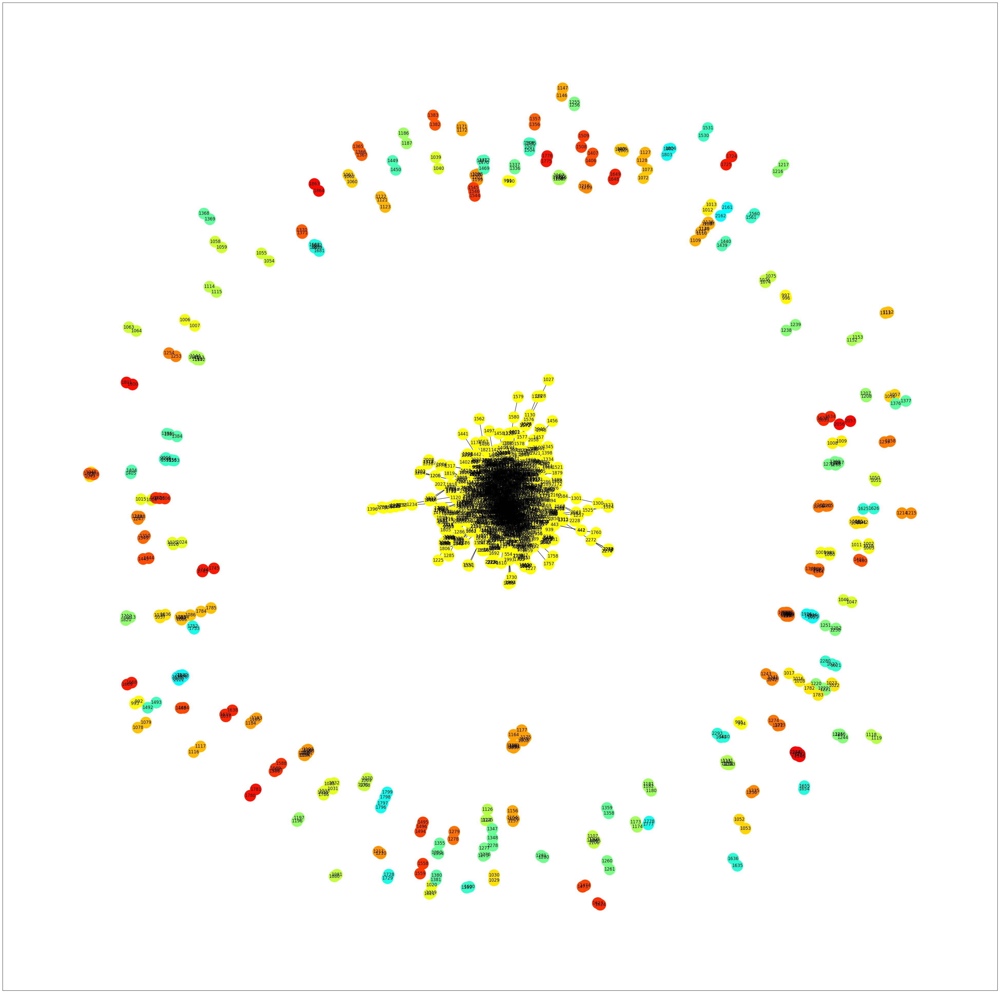

In [ ]:
#Test
communities = FindandShowCommunities(G, resolution=0)

In [ ]:
print(len(communities))

148


In [ ]:
nx.is_connected(G)

False

,Number of Nodes in Component
147,2
112,2
69,2
68,2
113,2
...,...
58,8
38,8
51,10
84,13


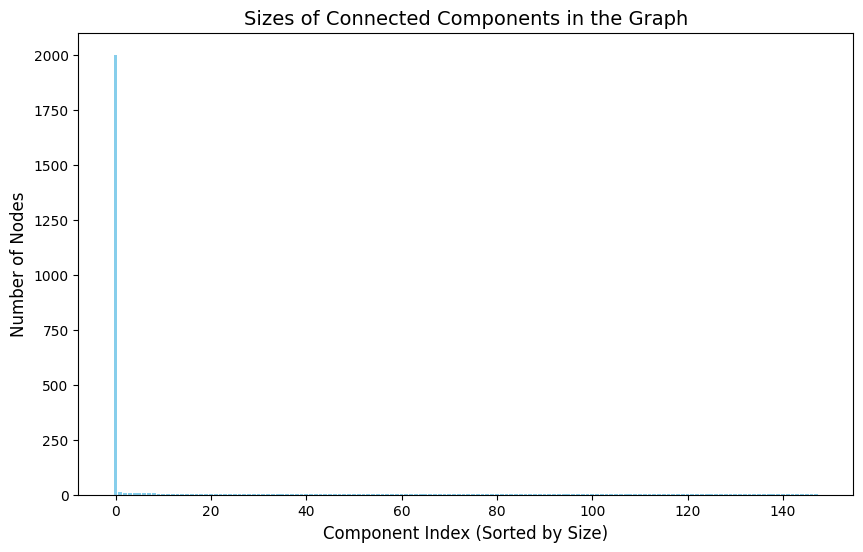

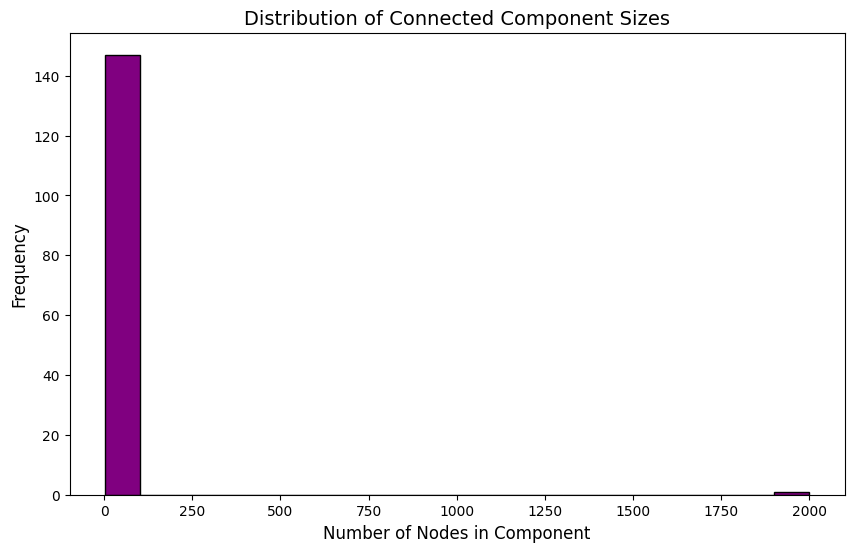

In [ ]:
# Get the connected components and their sizes
components = [len(c) for c in nx.connected_components(G)]

# Create a pandas dataframe to store the size of each connected component
df_components = pd.DataFrame(components, columns=['Number of Nodes in Component'])

# Display the dataframe
display(df_components.sort_values(by=['Number of Nodes in Component']))  # First few rows

# Plot the sizes of connected components as a bar chart
plt.figure(figsize=(10, 6))
df_components_sorted = df_components.sort_values(by='Number of Nodes in Component', ascending=False)

# Bar chart of connected component sizes
plt.bar(range(len(df_components_sorted)), df_components_sorted['Number of Nodes in Component'], color='skyblue')
plt.xlabel('Component Index (Sorted by Size)', fontsize=12)
plt.ylabel('Number of Nodes', fontsize=12)
plt.title('Sizes of Connected Components in the Graph', fontsize=14)
plt.show()

# Plot the distribution of connected component sizes
plt.figure(figsize=(10, 6))

# Histogram of component sizes
plt.hist(df_components['Number of Nodes in Component'], bins=20, color='purple', edgecolor='black')
plt.xlabel('Number of Nodes in Component', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Distribution of Connected Component Sizes', fontsize=14)
plt.show()

In [ ]:
print(df_components.describe())  # Summary statistics

       Number of Nodes in Component
count                    148.000000
mean                      16.391892
std                      164.168846
min                        2.000000
25%                        2.000000
50%                        2.000000
75%                        3.000000
max                     2000.000000


# Now that we know G is not fully connected

2 methods: <br>
<br>
-Only keep largest connected component and discoard the small separete connected components <br>
-Treat every small connected component as their own community <br>
<br>
Either way, we will need to isolate the largest connected component to run Loivain on it.

In [ ]:
# Get the largest connected component
largest_cc = max(nx.connected_components(G), key=len)

# Create a subgraph consisting of only the largest connected component
G_main = G.subgraph(largest_cc).copy()

# Sort the nodes and create a mapping to new consecutive integers starting from 0 (or 1)
node_mapping = {old_node: new_node for new_node, old_node in enumerate(sorted(G_main.nodes()), start=0)}  # Use start=1 if you want to start from 1

# Relabel the nodes with the new mapping
G_main = nx.relabel_nodes(G_main, node_mapping)

C:\Users\20193204\AppData\Local\Temp\ipykernel_7276\919545190.py:25: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(ScalarMappable(norm=norm, cmap=cmap), label='Log of Node Degree')  # Add a color bar


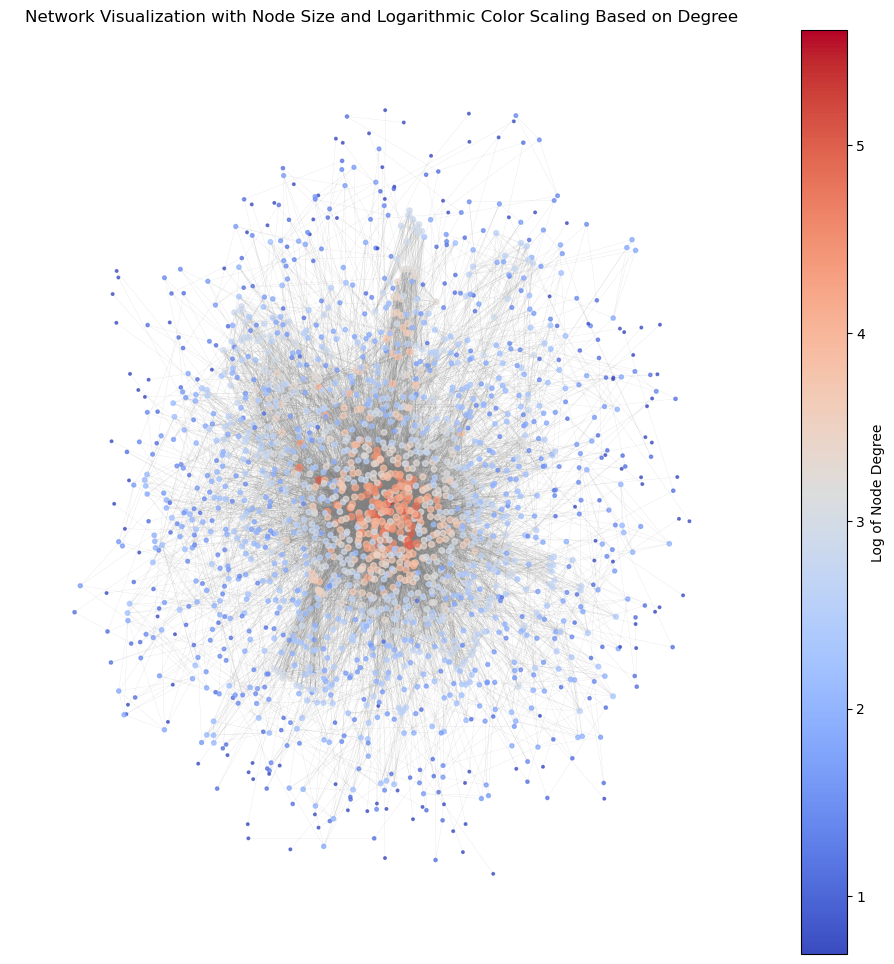

In [ ]:
# Get degrees of nodes
degrees = dict(G_main.degree())
degree_values = list(degrees.values())

# Logarithmic scaling for node sizes
node_sizes = [np.log(v + 1) * 5 for v in degree_values]  # Scale down sizes

# Logarithmic normalization for color mapping
log_degrees = np.log(np.array(degree_values) + 1)  # Logarithmic scaling with a small offset
norm = Normalize(vmin=log_degrees.min(), vmax=log_degrees.max())
cmap = plt.get_cmap('coolwarm')  # Transition from aqua to red

# Assign colors based on normalized logarithmic degrees
node_colors = [cmap(norm(log_degree)) for log_degree in log_degrees]

# Generate the spring layout with adjusted parameters
pos = nx.spring_layout(G_main, k=0.1, iterations=20)  # Adjust k for spacing

# Draw the graph
plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(G_main, pos, node_size=node_sizes, node_color=node_colors, alpha=0.7)
nx.draw_networkx_edges(G_main, pos, width=0.1, alpha=0.5, edge_color='gray')  # Increased edge visibility
plt.title('Network Visualization with Node Size and Logarithmic Color Scaling Based on Degree')
plt.axis('off')  # Turn off the axis
plt.colorbar(ScalarMappable(norm=norm, cmap=cmap), label='Log of Node Degree')  # Add a color bar
plt.show()

In [ ]:
number_of_cummunities = [15,20,25,30]
#resolutions = [1, 1.25, 1.5, 1.75, 2]
df_results2 = pd.DataFrame(columns=['expected communities', 'detected communities', 'resolution', 'community sizes', 'modularity'])

for cummunity_nr in number_of_cummunities:
    print(f'Testing for {cummunity_nr} communities')

    #Make a list of length cummunity_nr containing the nodes with the highest degrees
    top_degree_nodes = [node for node, degree in sorted(G_main.degree, key=lambda item: item[1], reverse=True)[:cummunity_nr]]
    resolution_problem = False

    #If we find a community where the number of neighbors with degree 1 is smaller than sqrt(E) where E is the total
    #number of edges in G, then the resolution problem needs to be handled
    for node in top_degree_nodes:
        neighbors_with_degree_1_or_less = [neighbor for neighbor in list(G_main.neighbors(node)) if G_main.degree(neighbor) <= 1]

        if len(neighbors_with_degree_1_or_less) <  G_main.number_of_edges()**0.5:
            resolution_problem = True

    if resolution_problem:

        print('Finding resolution where expected communities match detected communities')
        print('')
        resolution_found = False
        resolution = 1
        iteration = 1

        while not resolution_found:
            print(f'iteration {iteration}: testing for resolution {resolution}')

            if iteration == 1:
                communities = FindandShowCommunities(G_main, resolution=resolution, plot=False)
                previous_resolution = resolution
                if len(communities) == cummunity_nr:
                    #We found a suitable resolution
                    resolution_found = True
                elif len(communities) > cummunity_nr:
                    #Too many communities detected, so we decrease resolution
                    resolution = 0.75
                elif len(communities) < cummunity_nr:
                    #Too few communities detected, so we increase resolution
                    resolution = 1.25
                else:
                    raise Exception('Something went wrong, expected communities could not be compared to detected communities')

                #Calculate modularity and add results to df_results2
                communities_dict = {}
                for cluster_id, cluster in enumerate(communities):
                    for node in cluster:
                        communities_dict[node] = cluster_id
                mod_score = modularity(G_main, communities_dict)
                new_row = pd.DataFrame({'expected communities': [cummunity_nr], 'detected communities': [len(communities)],
                                        'resolution': [previous_resolution], 'community sizes': [[len(sublist) for sublist in communities]],
                                        'modularity': [mod_score]})
                df_results2 = pd.concat([df_results2, new_row], ignore_index=True)
                iteration += 1
                print(f'{len(communities)} communities detected')
                print('')

            else:
                communities = FindandShowCommunities(G_main, resolution=resolution, plot=False)

                if len(communities) == cummunity_nr:
                    #We found a suitable resolution
                    resolution_found = True
                    previous_resolution = resolution #For dataset entry

                elif len(communities) > cummunity_nr:
                    #Too many communities detected, so we decrease resolution
                    if resolution > previous_resolution:
                        #We increased resolution too much, so we decrease it
                        previous_resolution, resolution = resolution, (resolution + previous_resolution) / 2
                    elif resolution < previous_resolution:
                        #We did not decrease resolution enough, so we decrease it by 25%
                        previous_resolution, resolution = resolution, resolution * 0.75
#                     elif resolution == previous_resolution:
#                         #We should decrease our resolution, but very slowly, so we decrease by 10%
#                         previous_resolution, resolution = resolution, resolution * 0.9

                elif len(communities) < cummunity_nr:
                    #Too few communities detected, so we increase resolution
                    if resolution > previous_resolution:
                        #We did not increase resolution enough, so we increase it by 25%
                        previous_resolution, resolution = resolution, resolution * 1.25
                    elif resolution < previous_resolution:
                        #We decreased resolution too much, so we increase it
                        previous_resolution, resolution = resolution, (resolution + previous_resolution) / 2
#                     elif resolution == previous_resolution:
#                         #We should increase our resolution, but very slowly, so we increase by 10%
#                         previous_resolution, resolution = resolution, resolution * 1.1

                else:
                    raise Exception('Something went wrong, expected communities could not be compared to detected communities')

                #Calculate modularity and add results to df_results2
                communities_dict = {}
                for cluster_id, cluster in enumerate(communities):
                    for node in cluster:
                        communities_dict[node] = cluster_id
                mod_score = modularity(G_main, communities_dict)
                new_row = pd.DataFrame({'expected communities': [cummunity_nr], 'detected communities': [len(communities)],
                                        'resolution': [previous_resolution], 'community sizes': [[len(sublist) for sublist in communities]],
                                        'modularity': [mod_score]})
                df_results2 = pd.concat([df_results2, new_row], ignore_index=True)
                iteration += 1
                print(f'{len(communities)} communities detected')
                print('')

        print(f'Resolution of {resolution} has been selected for {cummunity_nr} expected communities')
        print('')
        print('')

    else:
        communities = FindandShowCommunities(G_main, resolution=1, plot=False)
        communities_dict = {}

        for cluster_id, cluster in enumerate(communities):
            for node in cluster:
                communities_dict[node] = cluster_id

        mod_score = modularity(G_main, communities_dict)
        new_row = pd.DataFrame({'expected communities': [cummunity_nr], 'detected communities': [len(communities)],
                                'resolution': [1], 'community sizes': [[len(sublist) for sublist in communities]],
                                'modularity': [mod_score]})
        df_results2 = pd.concat([df_results2, new_row], ignore_index=True)

Testing for 15 communities
Finding resolution where expected communities match detected communities

iteration 1: testing for resolution 1
29 communities detected

iteration 2: testing for resolution 0.75
23 communities detected

iteration 3: testing for resolution 0.5625
24 communities detected

iteration 4: testing for resolution 0.421875
27 communities detected

iteration 5: testing for resolution 0.31640625
25 communities detected

iteration 6: testing for resolution 0.2373046875
20 communities detected

iteration 7: testing for resolution 0.177978515625
19 communities detected

iteration 8: testing for resolution 0.13348388671875
13 communities detected

iteration 9: testing for resolution 0.155731201171875
16 communities detected

iteration 10: testing for resolution 0.1446075439453125
14 communities detected

iteration 11: testing for resolution 0.15016937255859375
15 communities detected

Resolution of 0.15016937255859375 has been selected for 15 expected communities


Testing 

In [ ]:
pd.set_option('display.max_rows', None)
display(df_results2)
pd.reset_option('all')

,expected communities,detected communities,resolution,community sizes,modularity
0,15,29,1,"[7, 193, 186, 347, 4, 69, 215, 7, 23, 222, 7, ...",0.536675
1,15,23,0.75,"[45, 7, 12, 205, 75, 4, 725, 7, 4, 51, 291, 7,...",0.510896
2,15,24,0.5625,"[7, 823, 7, 4, 12, 23, 12, 370, 7, 3, 3, 3, 3,...",0.490311
3,15,27,0.421875,"[7, 37, 1066, 4, 3, 7, 4, 12, 398, 7, 3, 3, 3,...",0.429727
4,15,25,0.316406,"[4, 1233, 7, 5, 12, 7, 11, 400, 3, 3, 7, 12, 3...",0.379707
5,15,20,0.237305,"[350, 4, 1301, 7, 12, 23, 12, 7, 3, 3, 3, 5, 1...",0.361476
6,15,19,0.177979,"[4, 5, 7, 23, 5, 24, 12, 7, 6, 3, 12, 3, 5, 5,...",0.089053
7,15,13,0.133484,"[23, 1893, 12, 7, 6, 12, 5, 15, 5, 7, 5, 4, 6]",0.051726
8,15,16,0.155731,"[23, 5, 1879, 12, 7, 6, 12, 3, 5, 15, 5, 6, 7,...",0.054728
9,15,14,0.144608,"[23, 1887, 12, 7, 6, 12, 5, 15, 5, 6, 7, 5, 4, 6]",0.053528


C:\Users\20193204\AppData\Local\Temp\ipykernel_7276\1132122250.py:3: FutureWarning: column_space is deprecated and will be removed in a future version. Use df.to_string(col_space=...) instead.
  pd.reset_option('all')
C:\Users\20193204\AppData\Local\Temp\ipykernel_7276\1132122250.py:3: FutureWarning: As the xlwt package is no longer maintained, the xlwt engine will be removed in a future version of pandas. This is the only engine in pandas that supports writing in the xls format. Install openpyxl and write to an xlsx file instead.
  pd.reset_option('all')
C:\Users\20193204\AppData\Local\Temp\ipykernel_7276\1132122250.py:3: FutureWarning: 
: boolean
    use_inf_as_null had been deprecated and will be removed in a future
    version. Use `use_inf_as_na` instead.

  pd.reset_option('all')


# Visualize community size distributions

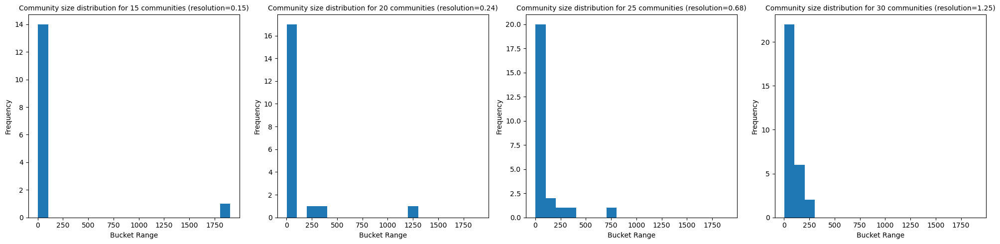

In [ ]:
data1 = df_results2.loc[10, 'community sizes']
data2 = df_results2.loc[16, 'community sizes']
data3 = df_results2.loc[28, 'community sizes']
data4 = df_results2.loc[30, 'community sizes']

# List of datasets to visualize
data_list = [data1, data2, data3, data4]
titles = ['Community size distribution for 15 communities (resolution=0.15)',
          'Community size distribution for 20 communities (resolution=0.24)',
          'Community size distribution for 25 communities (resolution=0.68)',
          'Community size distribution for 30 communities (resolution=1.25)']

# Create a subplot with 1 row and 3 columns
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# Set the desired bar width
bar_width = 100  # You can change this value to adjust the bar width

# Define custom bucket sizes
bucket_size = 100  # Change this to set the width of the buckets
bins = np.arange(min(min(data1), min(data2), min(data3)), max(max(data1), max(data2), max(data3)) + bucket_size, bucket_size)

# Loop through each dataset and plot its bar chart with custom buckets
for i, data in enumerate(data_list):
    # Use np.histogram to group data into bins
    y, bin_edges = np.histogram(data, bins=bins)

    # Get the bin centers for plotting
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

    # Plot each bar chart in its respective subplot with the specified width
    axes[i].bar(bin_centers, y, width=bar_width)
    axes[i].set_xlabel('Bucket Range')
    axes[i].set_ylabel('Frequency')

    # Set title with smaller font size
    axes[i].set_title(titles[i], fontsize=10)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plots
# Show the plots
plt.show()

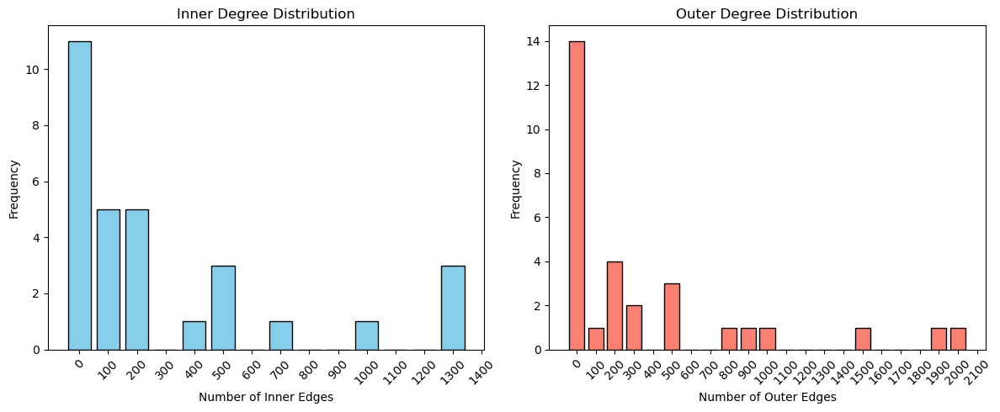

In [ ]:
#Visualize inner and outer degrees

# Function to calculate inner and outer degrees for clusters
def get_inner_outer_degrees(G_main, clusters):
    inner_degrees = []
    outer_degrees = []

    for cluster in clusters:
        inner_edges = 0
        outer_edges = 0

        for node in cluster:
            # Get the neighbors of the node in the graph
            neighbors = set(G_main.neighbors(node))

            # Inner edges: neighbors that are also within the cluster
            inner_neighbors = neighbors.intersection(cluster)
            inner_edges += len(inner_neighbors)

            # Outer edges: neighbors that are outside the cluster
            outer_neighbors = neighbors.difference(cluster)
            outer_edges += len(outer_neighbors)

        # Since each edge is counted twice (once from each node), divide by 2
        inner_degrees.append(inner_edges // 2)
        outer_degrees.append(outer_edges)

    return inner_degrees, outer_degrees

# Function to plot inner and outer degree distributions side by side
def plot_degree_distributions(inner_degrees, outer_degrees, bucket_size=100):
    # Create counters for inner and outer degrees
    inner_counter = Counter(inner_degrees)
    outer_counter = Counter(outer_degrees)

    # Set up the subplots
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))  # 1 row, 2 columns

    # Plot inner degrees
    inner_buckets = range(0, max(inner_counter.keys()) + bucket_size, bucket_size)
    inner_hist = [0] * (len(inner_buckets) - 1)

    for degree in inner_degrees:
        for i in range(len(inner_buckets) - 1):
            if inner_buckets[i] <= degree < inner_buckets[i + 1]:
                inner_hist[i] += 1
                break

    axs[0].bar(inner_buckets[:-1], inner_hist, width=bucket_size * 0.8, color='skyblue', edgecolor='black')
    axs[0].set_title('Inner Degree Distribution')
    axs[0].set_xlabel('Number of Inner Edges')
    axs[0].set_ylabel('Frequency')
    axs[0].set_xticks(inner_buckets)
    axs[0].set_xticklabels(inner_buckets, rotation=45)

    # Plot outer degrees
    outer_buckets = range(0, max(outer_counter.keys()) + bucket_size, bucket_size)
    outer_hist = [0] * (len(outer_buckets) - 1)

    for degree in outer_degrees:
        for i in range(len(outer_buckets) - 1):
            if outer_buckets[i] <= degree < outer_buckets[i + 1]:
                outer_hist[i] += 1
                break

    axs[1].bar(outer_buckets[:-1], outer_hist, width=bucket_size * 0.8, color='salmon', edgecolor='black')
    axs[1].set_title('Outer Degree Distribution')
    axs[1].set_xlabel('Number of Outer Edges')
    axs[1].set_ylabel('Frequency')
    axs[1].set_xticks(outer_buckets)
    axs[1].set_xticklabels(outer_buckets, rotation=45)

    # Display the plots
    plt.tight_layout()
    plt.show()

partition = FindandShowCommunities(G_main, resolution=1.25, plot=False)
inner_degrees, outer_degrees = get_inner_outer_degrees(G_main, partition)
plot_degree_distributions(inner_degrees, outer_degrees)

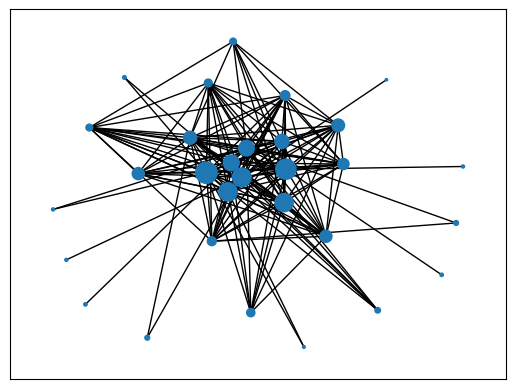

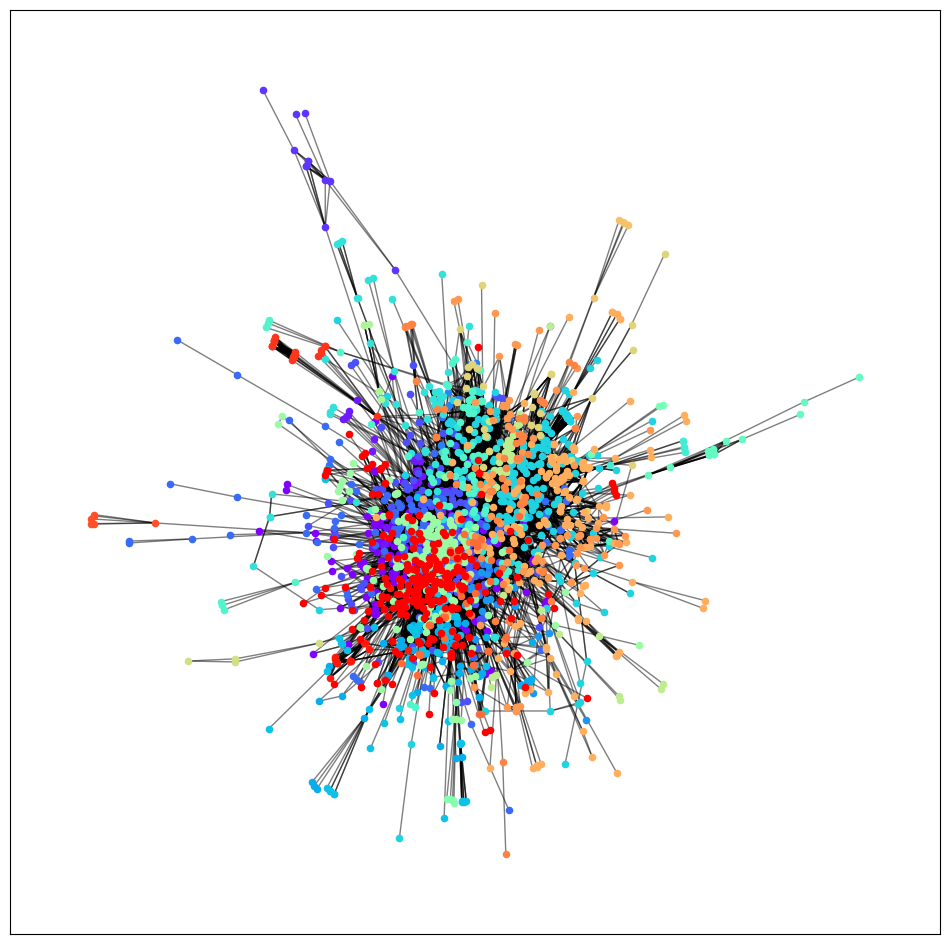

In [ ]:
#Visualize the entire data

# Run community detection (using Louvain method for this example)
partition = FindandShowCommunities(G_main, resolution=1.25, plot=False)

# Create a new graph where each community is a supernode
community_graph = nx.Graph()

# Add supernodes for each community
for i, community in enumerate(partition):
    community_graph.add_node(i, size=len(community))

# Add edges between supernodes based on inter-community connections in the original graph
for i, community1 in enumerate(partition):
    for j, community2 in enumerate(partition):
        if i < j:
            # Count edges between the two communities in the original graph
            inter_community_edges = sum(1 for n1 in community1 for n2 in community2 if G_main.has_edge(n1, n2))
            if inter_community_edges > 0:
                community_graph.add_edge(i, j, weight=inter_community_edges)

# Draw the community graph
pos = nx.spring_layout(community_graph, k=4)  # layout for positions
sizes = [nx.get_node_attributes(community_graph, 'size')[node] * 1 for node in community_graph.nodes]

nx.draw_networkx(community_graph, pos, node_size=sizes, with_labels=False)
plt.show()



# Create a color map for the communities
communities = partition
colors = cm.rainbow(np.linspace(0, 1, len(communities)))

# Draw the full graph but color by community
pos = nx.spring_layout(G_main, seed=632)  # or any other layout
plt.figure(figsize=(12, 12))

# Draw nodes community by community
for color, community in zip(colors, communities):
    nx.draw_networkx_nodes(G_main, pos, nodelist=community, node_size=20, node_color=[color])

# Draw edges
nx.draw_networkx_edges(G_main, pos, alpha=0.5)
plt.show()

# If balanced community sizes are important

We test out 50 resolution values between 0 and 1. <br>
Only if we detect between 15 and 25 communities, do we keep the resolution. We then select the resolution whose resoluting communities have the smallest variance

In [ ]:
resolutions = [np.round(i*0.02, 3) for i in range(1, 51)]
df_results3 = pd.DataFrame(columns=['resolution', 'detected communities', 'community sizes', 'modularity'])
progress = 0

for resolution in resolutions:
    if progress % 5 == 0:
        print(f"Progress: {progress}/{len(resolutions)}")
    communities = FindandShowCommunities(G_main, resolution=resolution, plot=False)

    #Calculate modularity and add results to df_results2
    communities_dict = {}
    for cluster_id, cluster in enumerate(communities):
        for node in cluster:
            communities_dict[node] = cluster_id
    mod_score = modularity(G_main, communities_dict)
    new_row = pd.DataFrame({'resolution': [resolution], 'detected communities': [len(communities)],
                            'community sizes': [[len(sublist) for sublist in communities]],
                            'modularity': [mod_score]})
    df_results3 = pd.concat([df_results3, new_row], ignore_index=True)
    progress += 1
print('Progress: Done')

Progress: 0/50
Progress: 5/50
Progress: 10/50
Progress: 15/50
Progress: 20/50
Progress: 25/50
Progress: 30/50
Progress: 35/50
Progress: 40/50
Progress: 45/50
Progress: Done


In [ ]:
pd.set_option('display.max_rows', None)
display(df_results3)
pd.reset_option('all')

,resolution,detected communities,community sizes,modularity
0,0.02,1,[2000],-8.639852e-16
1,0.04,4,"[12, 1959, 6, 23]",2.518679e-02
2,0.06,5,"[12, 1947, 12, 6, 23]",2.946541e-02
3,0.08,7,"[7, 12, 23, 1936, 12, 4, 6]",3.275909e-02
4,0.10,7,"[12, 23, 1936, 12, 7, 4, 6]",3.275909e-02
5,0.12,12,"[12, 23, 5, 1900, 12, 7, 6, 5, 15, 5, 4, 6]",4.920096e-02
6,0.14,14,"[23, 1887, 12, 7, 6, 12, 5, 15, 5, 6, 7, 5, 4, 6]",5.352826e-02
7,0.16,16,"[23, 5, 1879, 12, 7, 6, 12, 3, 5, 15, 5, 6, 7,...",5.472820e-02
8,0.18,21,"[4, 7, 23, 5, 24, 1837, 12, 7, 6, 4, 3, 12, 3,...",8.758575e-02
9,0.20,21,"[4, 7, 23, 5, 24, 1841, 12, 7, 6, 4, 3, 3, 12,...",8.547755e-02


C:\Users\20193204\AppData\Local\Temp\ipykernel_4968\1563090278.py:3: FutureWarning: column_space is deprecated and will be removed in a future version. Use df.to_string(col_space=...) instead.
  pd.reset_option('all')
C:\Users\20193204\AppData\Local\Temp\ipykernel_4968\1563090278.py:3: FutureWarning: As the xlwt package is no longer maintained, the xlwt engine will be removed in a future version of pandas. This is the only engine in pandas that supports writing in the xls format. Install openpyxl and write to an xlsx file instead.
  pd.reset_option('all')
C:\Users\20193204\AppData\Local\Temp\ipykernel_4968\1563090278.py:3: FutureWarning: 
: boolean
    use_inf_as_null had been deprecated and will be removed in a future
    version. Use `use_inf_as_na` instead.

  pd.reset_option('all')


In [ ]:
df_results3_filtered = df_results3[df_results3['community sizes'].apply(lambda x: 15 <= len(x) <= 25)]
df_results3_filtered

,resolution,detected communities,community sizes,modularity
7,0.16,16,"[23, 5, 1879, 12, 7, 6, 12, 3, 5, 15, 5, 6, 7,...",0.054728
8,0.18,21,"[4, 7, 23, 5, 24, 1837, 12, 7, 6, 4, 3, 12, 3,...",0.087586
9,0.20,21,"[4, 7, 23, 5, 24, 1841, 12, 7, 6, 4, 3, 3, 12,...",0.085478
10,0.22,19,"[4, 1338, 7, 12, 5, 12, 7, 21, 3, 3, 3, 5, 15,...",0.333206
11,0.24,19,"[4, 1305, 7, 23, 5, 12, 350, 7, 3, 3, 12, 3, 5...",0.361059
12,0.26,21,"[4, 1280, 7, 12, 5, 364, 12, 7, 15, 3, 3, 7, 3...",0.365185
13,0.28,23,"[4, 1277, 7, 5, 356, 12, 7, 3, 3, 7, 12, 3, 3,...",0.365785
14,0.30,24,"[4, 1266, 7, 5, 12, 7, 11, 372, 3, 3, 7, 12, 3...",0.369689
15,0.32,22,"[4, 1185, 7, 12, 23, 438, 12, 7, 11, 3, 3, 3, ...",0.387739
16,0.34,24,"[4, 1151, 7, 12, 23, 15, 12, 7, 11, 3, 3, 3, 3...",0.403511


Lowest variance detected: 12843.04
Resolution that leads to lowest variance: 0.9
index of row with the lowest variance: 44
Plotting distribution


C:\Users\20193204\AppData\Local\Temp\ipykernel_4968\2013625064.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_results3_filtered['variance'] = df_results3_filtered['community sizes'].apply(list_variance)


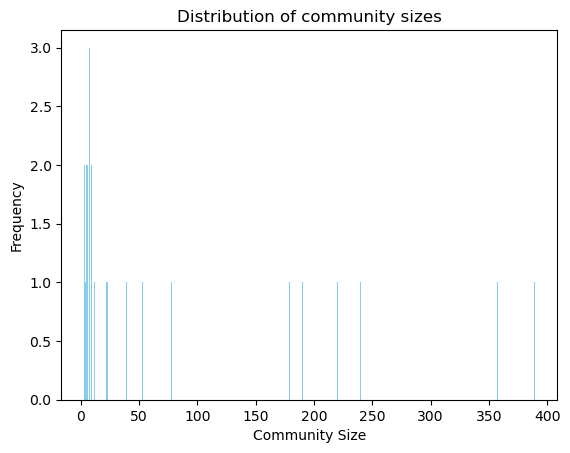

In [ ]:
# Function to calculate variance for lists
def list_variance(lst):
    return np.var(lst)

# Apply the variance function to the "community size" column
df_results3_filtered['variance'] = df_results3_filtered['community sizes'].apply(list_variance)

# Find the index of the row with the lowest variance
lowest_variance_index = df_results3_filtered['variance'].idxmin()

# Select the row with the lowest variance
lowest_variance_row = df_results3_filtered.loc[lowest_variance_index]

# Output the row with the lowest variance
print(f"Lowest variance detected: {list_variance(df_results3_filtered.loc[lowest_variance_index, 'community sizes'])}")
print(f"Resolution that leads to lowest variance: {df_results3_filtered.loc[lowest_variance_index, 'resolution']}")
print(f"index of row with the lowest variance: {lowest_variance_index}")
print('Plotting distribution')

lst = df_results3_filtered.loc[lowest_variance_index, 'community sizes']

# Count occurrences of each element
counter = Counter(lst)

# Get the unique elements (x) and their counts (y)
x = list(counter.keys())
y = list(counter.values())

# Create the bar chart
plt.bar(x, y, color='skyblue')

# Add labels and title
plt.xlabel('Community Size')
plt.ylabel('Frequency')
plt.title('Distribution of community sizes')

# Show the plot
plt.show()

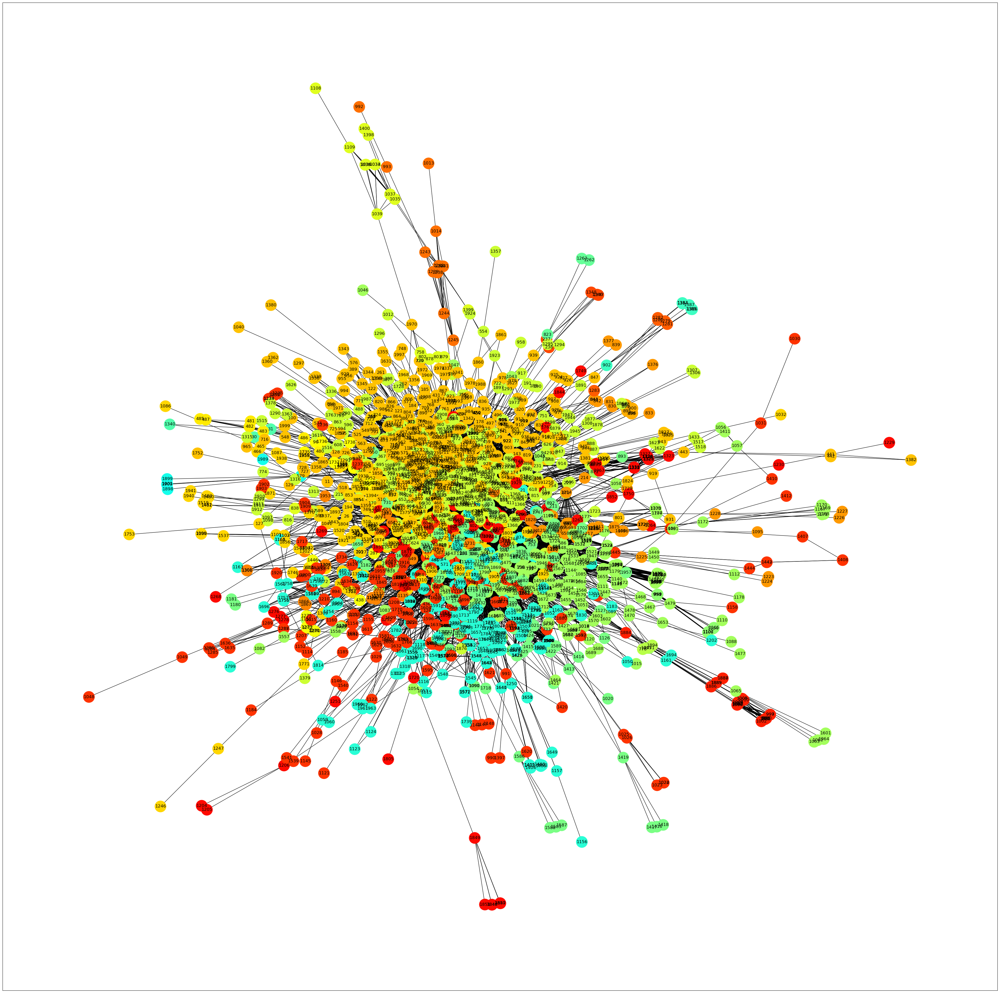

In [ ]:
communities = FindandShowCommunities(G_main, resolution=df_results3_filtered.loc[lowest_variance_index, 'resolution'], plot=True)